<a href="https://colab.research.google.com/github/s0ku00/DTS/blob/main/Taxi_ex.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
data = pd.read_excel("/content/Power BI Dataset taxi_organization_data.xlsx")

In [3]:
print(data.head())

  vendor_id     pickup_datetime    dropoff_datetime  passenger_count  \
0      V003 2024-07-05 14:04:12 2024-07-05 14:16:12                4   
1      V001 2024-05-16 15:53:50 2024-05-16 16:29:50                2   
2      V004 2024-07-30 22:05:17 2024-07-30 23:05:17                4   
3      V004 2024-07-25 10:04:34 2024-07-25 10:53:34                1   
4      V001 2024-07-09 21:10:46 2024-07-09 21:43:46                3   

   trip_distance  pickup_latitude  pickup_longitude  dropoff_latitude  \
0            6.9        40.678362        -73.968892         40.639226   
1            2.5        40.865106        -74.054843         40.869557   
2            1.4        40.666185        -73.891848         40.870419   
3            6.3        40.614159        -73.811814         40.894846   
4            5.7        40.754890        -73.911257         40.751192   

   dropoff_longitude  location  ... tip_amount  total_amount  weather  \
0         -74.015532   Suburbs  ...       2.97         

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 22 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   vendor_id          1000 non-null   object        
 1   pickup_datetime    1000 non-null   datetime64[ns]
 2   dropoff_datetime   1000 non-null   datetime64[ns]
 3   passenger_count    1000 non-null   int64         
 4   trip_distance      1000 non-null   float64       
 5   pickup_latitude    1000 non-null   float64       
 6   pickup_longitude   1000 non-null   float64       
 7   dropoff_latitude   1000 non-null   float64       
 8   dropoff_longitude  1000 non-null   float64       
 9   location           1000 non-null   object        
 10  payment_type       1000 non-null   object        
 11  fare_amount        1000 non-null   float64       
 12  tip_amount         1000 non-null   float64       
 13  total_amount       1000 non-null   float64       
 14  weather  

In [ ]:
data.isnull().sum()

,0
vendor_id,0
pickup_datetime,0
dropoff_datetime,0
passenger_count,0
trip_distance,0
pickup_latitude,0
pickup_longitude,0
dropoff_latitude,0
dropoff_longitude,0
location,0


In [ ]:
!pip install ydata-profiling

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 356.2/356.2 kB 8.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 22.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 22.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 8.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 53.6 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=41649005584ab20188b920520c33db88aa9e8e1126277de681be1fd19433fee1
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [ ]:
from ydata_profiling import ProfileReport

profile = ProfileReport(data, title='Taxi Data Profiling Report')

profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

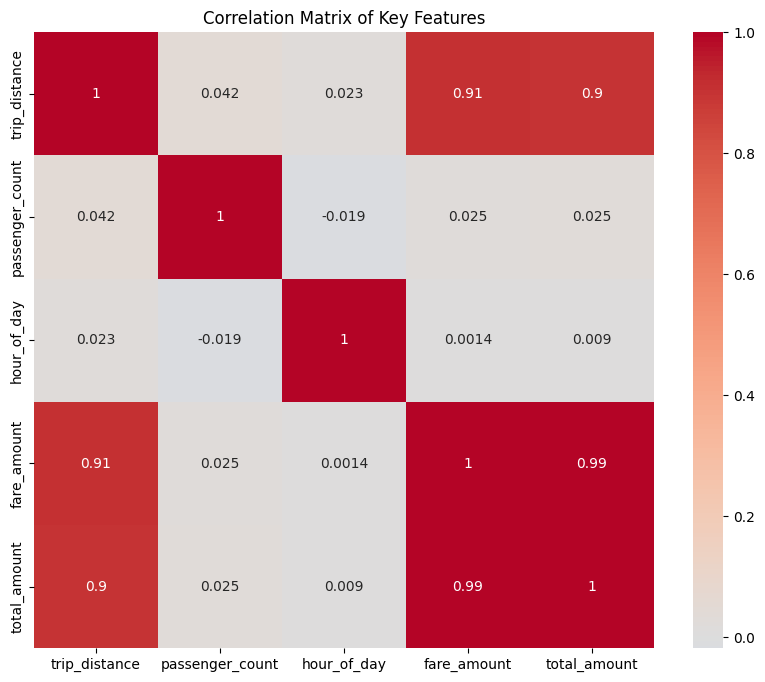

In [6]:
# Correlation Matrix
plt.figure(figsize=(10, 8))
correlation_matrix = data[['trip_distance', 'passenger_count', 'hour_of_day', 'fare_amount', 'total_amount']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Matrix of Key Features')
plt.show()

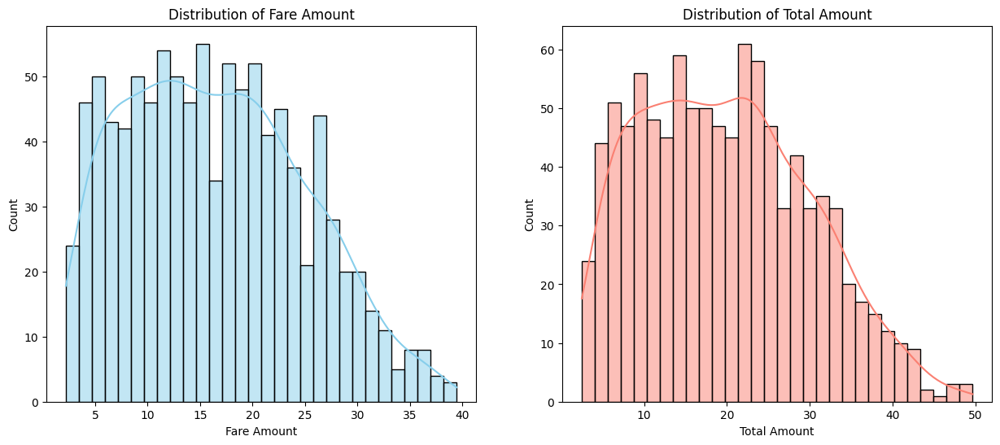

In [7]:
# Univariate Analysis - Distribution of fare_amount and total_amount
fig, axes = plt.subplots(1, 2, figsize=(15, 6))
sns.histplot(data['fare_amount'], bins=30, kde=True, ax=axes[0], color='skyblue')
axes[0].set_title('Distribution of Fare Amount')
axes[0].set_xlabel('Fare Amount')

sns.histplot(data['total_amount'], bins=30, kde=True, ax=axes[1], color='salmon')
axes[1].set_title('Distribution of Total Amount')
axes[1].set_xlabel('Total Amount')
plt.show()

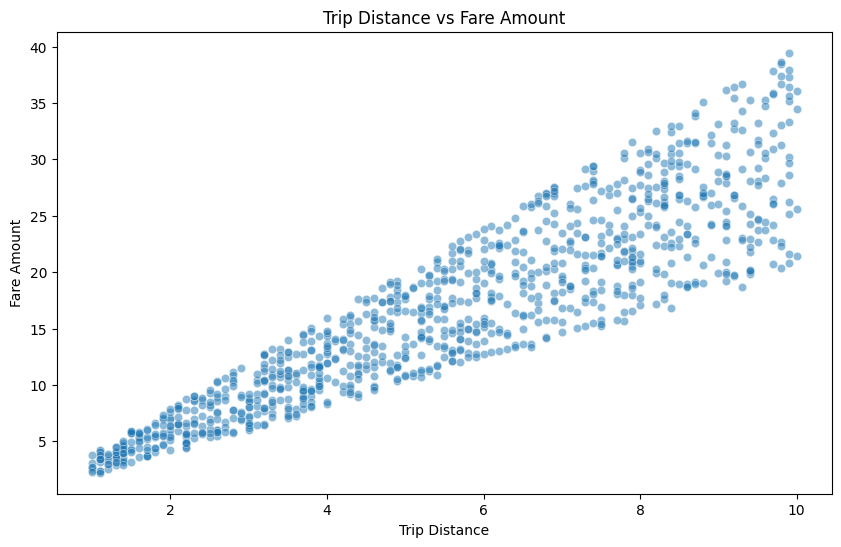

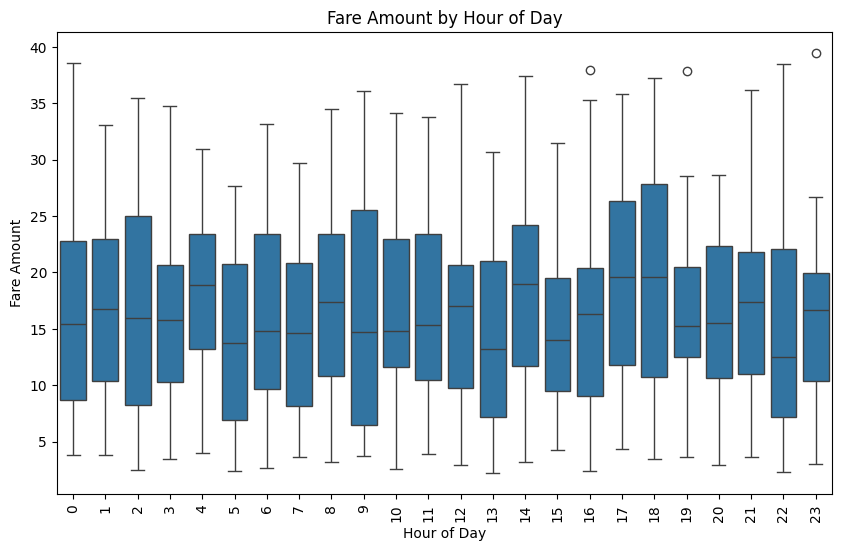

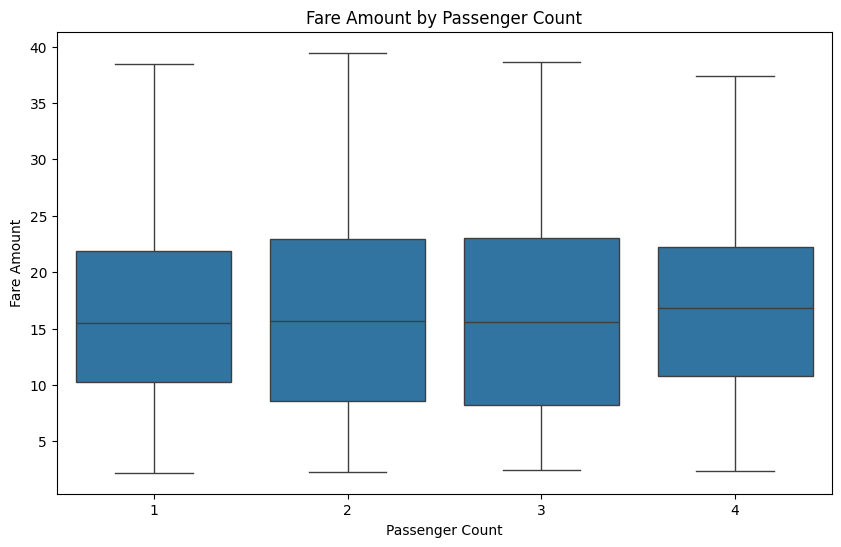

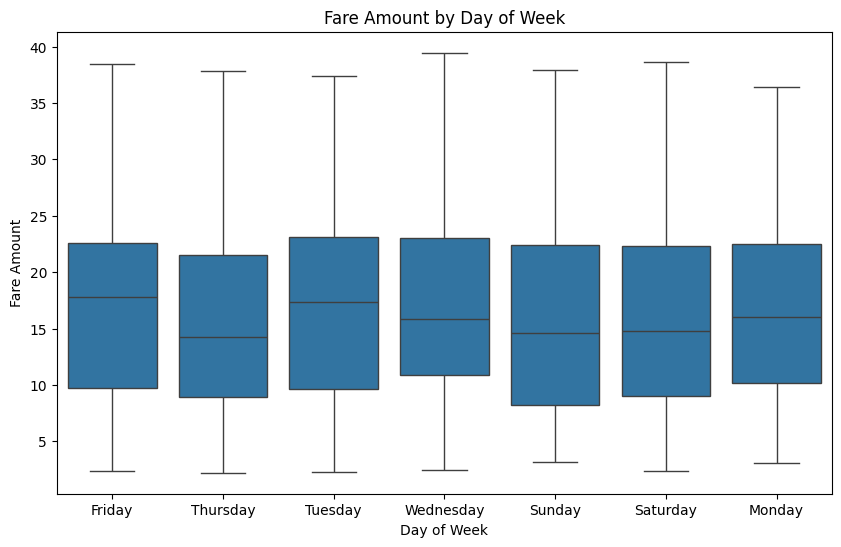

In [8]:
# Bivariate Analysis - Scatter plot of Trip Distance vs Fare Amount
plt.figure(figsize=(10, 6))
sns.scatterplot(x='trip_distance', y='fare_amount', data=data, alpha=0.5)
plt.title('Trip Distance vs Fare Amount')
plt.xlabel('Trip Distance')
plt.ylabel('Fare Amount')
plt.show()

# Bivariate Analysis - Fare Amount by Hour of Day
plt.figure(figsize=(10, 6))
sns.boxplot(x='hour_of_day', y='fare_amount', data=data)
plt.title('Fare Amount by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Fare Amount')
plt.xticks(rotation=90)
plt.show()

# Bivariate Analysis - Fare Amount by Passenger Count
plt.figure(figsize=(10, 6))
sns.boxplot(x='passenger_count', y='fare_amount', data=data)
plt.title('Fare Amount by Passenger Count')
plt.xlabel('Passenger Count')
plt.ylabel('Fare Amount')
plt.show()

# Bivariate Analysis - Fare Amount by Day of Week
plt.figure(figsize=(10, 6))
sns.boxplot(x='day_of_week', y='fare_amount', data=data)
plt.title('Fare Amount by Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Fare Amount')
plt.show()